In [1]:
from plotly.offline import init_notebook_mode
import plotly.graph_objects as go
init_notebook_mode()
from PIL import Image
from RLtools.data_processing.stylusprofiler.debug_tulip import generate_report, CircleStructure
from RLtools.Utilities.file_io import get_fname, read_files_to_dict
from RLtools.data_processing.stylusprofiler.surfaceprofile import (results_folder,
        SurfaceProfile, add_profile_and_align, show_substrate, get_sample_rundata, blank_dektak_figure,
        report_etch_characteristics)

pre = (read_files_to_dict(results_folder + '/Pre Strip', '*.txt', SurfaceProfile))
post = (read_files_to_dict(results_folder + '/Post Strip', '*.txt', SurfaceProfile))
img = read_files_to_dict(results_folder + '\Post Strip\Images\Final 2x ash', '*.tif')
sample_id = 41
s_id = str(sample_id)

# Sample 41
## Run Data


In [2]:
get_sample_rundata(sample_id)

,Process,carrier,HBr,Ar,Pressure mT,RF Power,ICP power,Temp,Time (min),Sample# Res C
13,16,Si wafer - not bonded,21,9,5.5,200,400,20,10,41.0


## Post Strip Micrograph

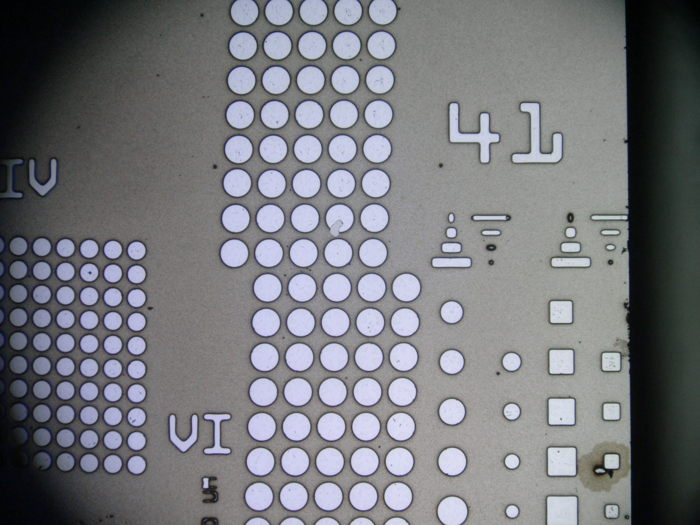

In [3]:
pic = Image.open(img[str(sample_id)])
pic.thumbnail((700,700))
pic

## Dektak Pre/Post Resist Strip Comparison


In [4]:
xxrange = [3800, 4300]
etch_depth = 3.93

f = blank_dektak_figure()           
add_profile_and_align(f, pre[s_id], 0, 0, name=f'{s_id} Pre-strip')
add_profile_and_align(f, post[s_id],2000,0,  name=f'{s_id} Post Strip')

f.update_xaxes(range=xxrange)
show_substrate(f, etch_depth)

In [5]:
report_etch_characteristics(pre, post, s_id, xxrange, etch_depth, verbose = True)

Total depth after etching is 11.619 um
Calculated remaining resist as 7.69um, indicating an erosion of 1.05um in 10 minutes of etching
This equates to an erosion rate of 105 nm/min
The etch depth of 3.93um in 10 mins indicates an etch rate of 393.0nm/min
The selectivity is therefore 3.74:1


,Result
Initial resist (um),8.741000
Total depth after etch (um),11.618900
Remaining resist (um),7.688900
Semiconductor etched(um),3.930000
Etch rate (nm/min),393.000000
Erosion rate (nm/min),105.210000
Selectivity,3.735386
